In [2]:
import json
import re
import collections
import pandas as pd
import seaborn as sns
import plotly.express as px
from skimpy import skim
from tqdm.notebook import tqdm
from typing import Optional, List, Tuple, Dict, Generator

# Warning
import warnings

# Matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# NLTK
import nltk
from nltk.tokenize import word_tokenize

# Gensim
from gensim import downloader
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.parsing.preprocessing import (preprocess_string, strip_numeric,
                                          strip_punctuation, strip_short,
                                          strip_multiple_whitespaces, remove_stopwords)

# Scipy
from scipy.stats import mannwhitneyu

# Numpy
import numpy as np

# Sklearn
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

# FastText
import fasttext

# Sentence Transformers
from sentence_transformers import SentenceTransformer

# WordCloud
import wordcloud

# UMAP
import umap

# Transformers
from transformers import AutoTokenizer

# Levenshtein
from Levenshtein import ratio as levenshtein_distance

# Initialisation
tqdm.pandas()
plt.style.use('ggplot')
warnings.filterwarnings('ignore')
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/opop/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
#autoreload
%load_ext autoreload
%autoreload 2

In [13]:
df = pd.read_csv('../../train.csv')

In [4]:
df.head()

,essay_id,full_text,score
0,000d118,Many people have car where they live. The thin...,3
1,000fe60,I am a scientist at NASA that is discussing th...,3
2,001ab80,People always wish they had the same technolog...,4
3,001bdc0,"We all heard about Venus, the planet without a...",4
4,002ba53,"Dear, State Senator\n\nThis is a letter to arg...",3


In [5]:
df = df.rename(columns={'score': 'labels', 'full_text': 'text'})
df = df.drop(columns=['essay_id'], axis=1)

In [6]:
df.head()

,text,labels
0,Many people have car where they live. The thin...,3
1,I am a scientist at NASA that is discussing th...,3
2,People always wish they had the same technolog...,4
3,"We all heard about Venus, the planet without a...",4
4,"Dear, State Senator\n\nThis is a letter to arg...",3


EDA - Analayse du dataset

In [7]:
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 17307  │ │ string      │ 1     │                                                          │
│ │ Number of columns │ 2      │ │ int64       │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━┳━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┓  │
│ ┃ column_name        ┃ NA   ┃ NA %    ┃ mean    ┃ sd   ┃ p0   ┃ p25    ┃ p50    ┃ p75   ┃ p100    ┃ hist     ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━╇━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━┩  │
│ │ labels             │    0 │       0 │     2.9 │    1 │    1 │      2 │      3 │     4 │       6 │  ▂▆▇▅▁   │  │
│ └────────────────────┴──────┴─────────┴─────────┴──────┴──────┴────────┴────────┴───────┴─────────┴──────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name               ┃ NA      ┃ NA %       ┃ words per row                ┃ total words              ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ text                      │       0 │          0 │                          380 │                  6643794 │  │
│ └───────────────────────────┴─────────┴────────────┴──────────────────────────────┴──────────────────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

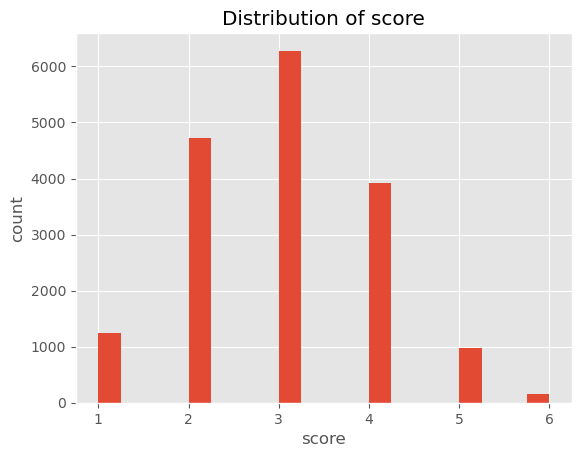

In [25]:
plt.hist(df['labels'], bins=20)
plt.xlabel('score')
plt.ylabel('count')
plt.title('Distribution of score')
plt.show()

La colonne à prédire est la colonne `score`, on remarque que les valeures prenables sont discrètes, on pourrait donc avoir envie de se diriger vers une classification. Cependant, le caractère ordinal de notre *label* ainsi que la distribution qui semble normale nous donne envie de nous diriger vers une régression. Cependant, on de part le fait que la variable est discrète, on sera contraint à arrondir à l'entier le plus proche, après tot c'est ce que font les correcteurs du BAC français donc pourquoi pas la machine ?

In [9]:
def compute_length(text: str) -> int:
    """
    Compute the length of the text

    Args:
        text {str} the text to be processed
    Returns:
        int: the length of the text
    """
    
    return len(word_tokenize(text))

[nltk_data] Downloading package punkt to /Users/opop/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [10]:
df['length'] = df['text'].progress_apply(compute_length)

  0%|          | 0/17307 [00:00<?, ?it/s]

In [16]:
def plot_violins(df: pd.DataFrame, 
                 x: str, 
                 y: str,
                 output_path: Optional[str] = None) -> None:
    """
    Plot violin plots

    Args:
        df {pd.DataFrame} -- the dataframe
        x {str} -- the x-axis
        y {str} -- the y-axis
        output_path {Optional[str]} -- the output path
    """
    
    plt.figure(figsize=(10, 6))
    sns.violinplot(x=x, y=y, data=df)
    plt.title(f'{y} vs {x}')
    if output_path:
        plt.savefig(output_path)
    plt.show()

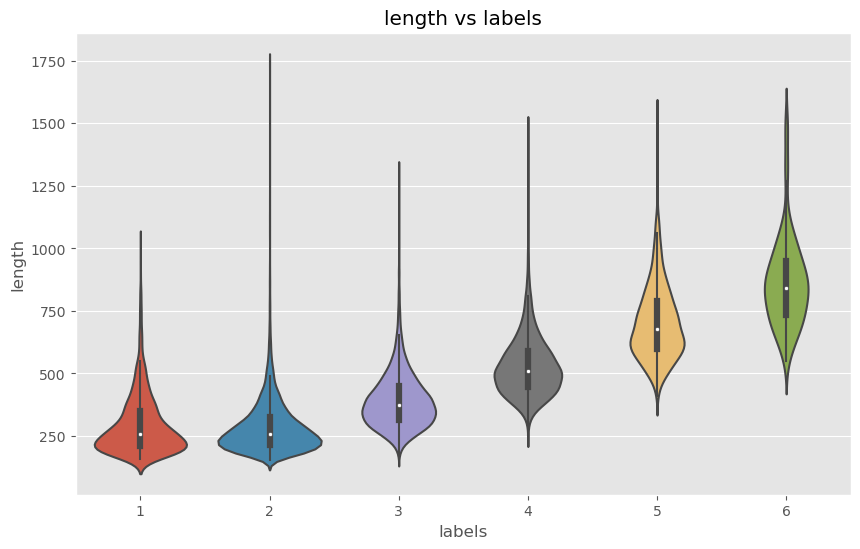

In [26]:
plot_violins(df, 'labels', 'length')

La figure ci-dessus nous montre l'évolution du nombre de tokens en fonction de la note, on remarque que c'est complètement croissant. Une nouvelle qui peut rendre la tâche plus compliquée c'est la taille que certains essais peuvent atteindre, en effet on remarque certains peuvent dépasser les 1000 tokens, pour information, un modèle comme `BERT` ne prend en entrée que 512 tokens (même si, forcément, ce sera pas le même tokenizer, on peut tout de même connjecturer qu'on dépassera le seuil facilement). Si on utilise ce genre de modèle, il faudra donc se résoudre à réfléchir à comment intégrer un maximum d'informations.

In [28]:
def plot_word_clouds(df: pd.DataFrame, 
                     column: str,
                     output_path: Optional[str] = None) -> None:
    """
    Plot word clouds for each label

    Args:
        df {pd.DataFrame} -- the dataframe
        column {str} -- the column to be processed
        output_path {Optional[str]} -- the output path
    """

    fig, axes = plt.subplots(2, 3, figsize=(20, 8))
    labels = sorted(df['labels'].unique())

    for i, label in enumerate(labels):
        ax = axes[i // 3, i % 3]
        wc = wordcloud.WordCloud(width=800, height=400).generate(' '.join(df[df['labels'] == label][column]))
        ax.imshow(wc)
        ax.set_title(f'{label}')
        ax.axis('off')
    
    plt.suptitle(f'Word Clouds of each score', fontsize=20, y=0.96)
    plt.tight_layout
    if output_path:
        plt.savefig(output_path)
    plt.show()

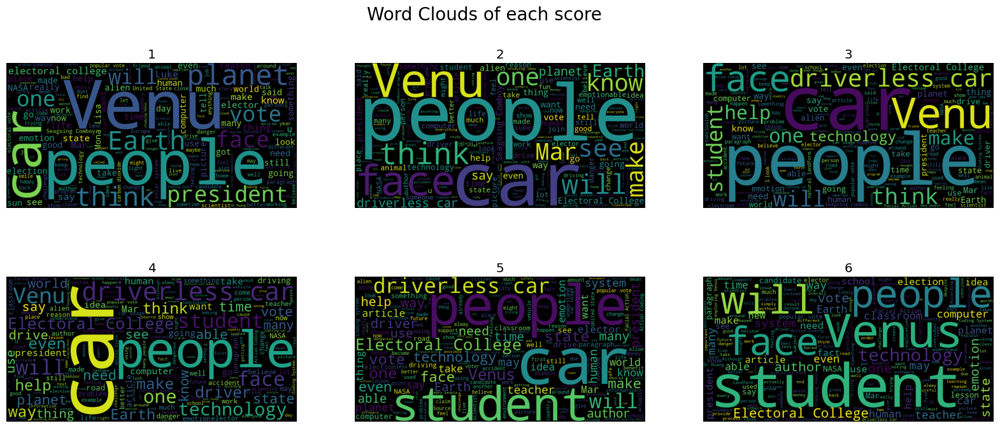

In [29]:
plot_word_clouds(df, 'text')

La figure ci dessus nous montre les mots les plus fréquents en fonction de la note, une première remarque, c'est qu'on aurait pu combiner cette visualisation avec du preprocessing comme le stemming, lemmatisation ou ben juste la supression de stopwords(c'est ce que je fais habituellement pour être honnête). Mais si on se place dans le contexte d'essais qui visent à être noté, un première chose qu'on peut souligner c'est que les fautes seront moins fréquentes que dans des tweets, donc le côté "factorisant" des techniques mentionnées ne seraient pas tant que ça une plus value, maintenant si on s'intéressait aux lemmes (ou bien juste à un degré de précision plus bas), ça pourrait tout de même être intéressant de voir le résultat.  

Ce qu'on peut notifier sur notre figure, c'est que globalement on retrouve les mêmes termes, montrant que les essais font sûrement parti d'une discipline particulière, de plus on remarque le mot *student* émerger en même temps que la note croit.  

On va peut être se concentrer sur le top 3 pour chaque note pour voir si on peut distinguer certaines choses plus précises(Wordcloud fais lui même un travail sur les stopwords, la on va devoir le faire nous même)

Avant d'implementer la fonction, je propose de faire un nettoyage sur notre colonne `text`, plusieurs options s'offre à nous. Soit on implémente nous même une fonction utilisant les modules `re` ainsi que `nltk`, l'avantage serait qu'on aurait un controle complet du nettoyage. Ou bien, plus rapide, on utilise une fonction de `gensim` `preprocessing_string` qui nettoie très efficacement le texte. Attention ! Cette fonction applique du stemming

In [27]:
df["stemmed_text"] = df["text"].progress_apply(lambda x: " ".join(preprocess_string(x)))

  0%|          | 0/17307 [00:00<?, ?it/s]

In [50]:
def plot_podium(df: pd.DataFrame, 
                column: str,
                top_k: int = 3,
                output_path: Optional[str] = None) -> None:
    """
    Plot podiums for each label

    Args:
        df {pd.DataFrame} -- the dataframe
        column {str} -- the column to be processed
        output_path {Optional[str]} -- the output path
    """

    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    labels = sorted(df['labels'].unique())

    for i, label in enumerate(labels):
        ax = axes[i // 3, i % 3]
        top_words = pd.Series(' '.join(df[df['labels'] == label][column]).split()).value_counts().head(top_k)
        top_words = top_words.sort_values(ascending=True)
        top_words.plot(kind='barh', ax=ax)
        ax.set_title(f'{label}')
    
    plt.suptitle(f'Top {top_k} words of each score', fontsize=20)
    plt.tight_layout
    if output_path:
        plt.savefig(output_path)
    plt.show()

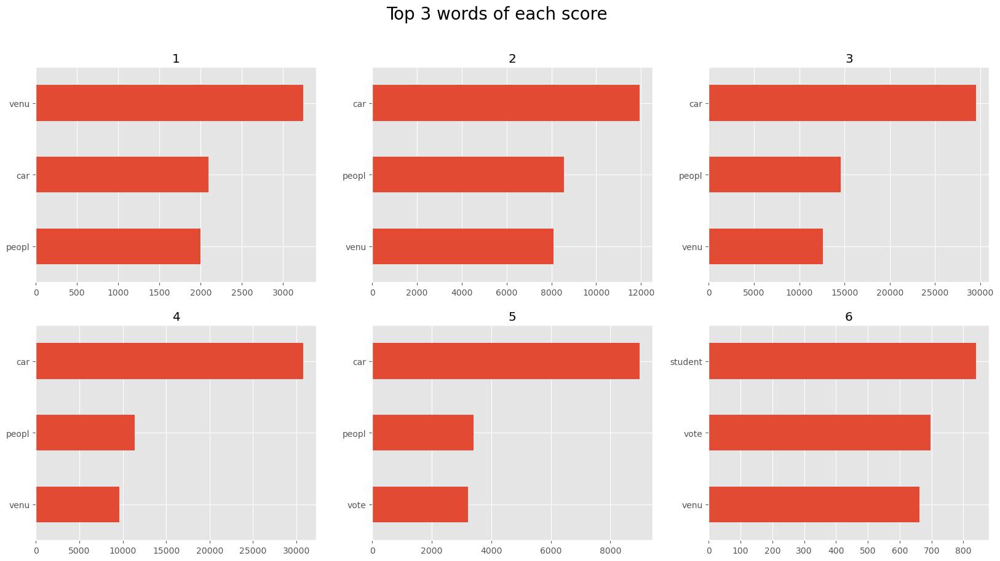

In [51]:
plot_podium(df, 'stemmed_text')

On peut reprendre les mêmes constats faits pour la figure précedente. On a globalement les mêmes tokens qui apparaissent pour chaque note.

Dans ce projet, nous allons entrainer de smodèles de différentes manières. Il y aura de la régression puis arrondissement, mais aussi différentes méthodologies d'entraînements. Notamment ce qu'on peut appeler la **FeatureExtraction**. Ce qu'on va faire c'est que nous allons utiliser une technique de vectorisation fréquentielle (`TF-IDF`), qu'on va comparer à d'autres méthodes d'embeddings, notamment `GloVe`, `FastText`et une architecture de style Transformer (Auto-Encoder, ou ce qu'on appelle EmbeddingModel).  

Avant d'entrainer des modèles de Machine Learning, on peut visualiser nos données vectorisée à l'aide d'algorithme de réduction de dimension.

In [30]:
info_model = downloader.info()

for model_name, model_info in info_model['models'].items():
    if 'glove' in model_name:
        print(model_name, model_info['file_size'])

glove-wiki-gigaword-50 69182535
glove-wiki-gigaword-100 134300434
glove-wiki-gigaword-200 264336934
glove-wiki-gigaword-300 394362229
glove-twitter-25 109885004
glove-twitter-50 209216938
glove-twitter-100 405932991
glove-twitter-200 795373100


On a ci-dessus la liste de tous les modèles qu'on peut directement télécharger avec la fonction `load`

In [13]:
glove = downloader.load('glove-wiki-gigaword-300')

Il ne faut jamais combiner des techniques tel que le stemming avec des modèles pré-entrainés, au risque de ne se retrouver qu'avec des tokens inconnus. Les modèles ont un vocabulaire bien fixé. (Note: l'affirmation sur les tokens inconnus n'est pas tout à fait vraie pour les modèles transformers)

Maintenant nous allons analyser à quel point le modèle couvre le vocabulaire de notre corpus, c'est une information essentielle pour la suite.

In [32]:
def simple_cleaning(text: str) -> str:
    """
    Simple cleaning

    Args:
        text {str} -- the text to be processed
    Returns:
        str: the processed text
    """

    text = strip_multiple_whitespaces(text)
    text = strip_numeric(text)
    text = strip_punctuation(text)
    text = strip_short(text)

    text = text.lower()
    
    return text                                 

In [33]:
df["simple_cleaned_text"] = df["text"].progress_apply(simple_cleaning)

  0%|          | 0/17307 [00:00<?, ?it/s]

In [34]:
df

,text,labels,length,stemmed_text,simple_cleaned_text
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...
4,"Dear, State Senator\n\nThis is a letter to arg...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...
...,...,...,...,...,...
17302,"the story "" The Challenge of Exploing Venus "" ...",2,167,stori challeng explo venu inform piec danger r...,the story the challenge exploing venus informa...
17303,Technology has changed a lot of ways that we l...,4,644,technolog chang lot wai live todai nowadai pho...,technology has changed lot ways that live toda...
17304,If you don't like sitting around all day than ...,2,235,like sit dai great opportun particip seago cow...,you don like sitting around all day than great...
17305,"In ""The Challenge of Exporing Venus,"" the auth...",1,264,challeng expor venu author suggest studi venu ...,the challenge exporing venus the author sugges...


In [53]:
words = word_tokenize(' '.join(df['simple_cleaned_text']))

In [54]:
print(f"There is a total of {len(words)} words, from which {len(set(words))} are unique")

There is a total of 5024506 words, from which 63979 are unique


In [55]:
def vocabulary_coverage_glove(df: pd.DataFrame,
                              column: str,
                              model) -> dict:
    """
    Compute the vocabulary coverage

    Args:
        df {pd.DataFrame} -- the dataframe
        column {str} -- the column to be processed
        model {model} -- the gloVe model
    Returns:
        float: the vocabulary coverage
    """

    words = set(model.index_to_key)
    text = ' '.join(df[column])
    words_in_text = set(word_tokenize(text))

    dict_out = {
        'vocabulary_coverage': len(words_in_text.intersection(words)) / len(words_in_text),
        'words_not_in_glove': words_in_text.difference(words)
    }

    return dict_out

In [56]:
value_coverage = vocabulary_coverage_glove(df, 'simple_cleaned_text', glove)

In [57]:
value_coverage2 = vocabulary_coverage_glove(df, 'stemmed_text', glove)

In [58]:
def plot_value_coverage(list_dict: list,
                        list_labels: list,
                        output_path: Optional[str] = None) -> None:
    
    """
    Plot the value coverage

    Args:
        list_dict {list} -- the list of dictionaries
        list_labels {list} -- the list of labels
        output_path {Optional[str]} -- the output path
    """

    val = [x['vocabulary_coverage'] for x in list_dict]

    plt.bar(list_labels, val)
    plt.title('Vocabulary Coverage')
    if output_path:
        plt.savefig(output_path)
    plt.show()


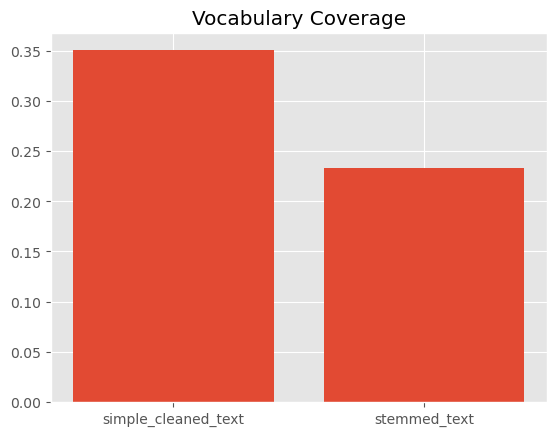

In [59]:
plot_value_coverage([value_coverage, value_coverage2], ['simple_cleaned_text', 'stemmed_text'])

In [31]:
def errors_by_score(df: pd.DataFrame,
                    column: str,
                    model) -> None:
    """
    Compute the errors by score

    Args:
        df {pd.DataFrame} -- the dataframe
        column {str} -- the column to be processed
        model {model} -- the gloVe model
    """

    words = set(model.index_to_key)
    df_tmp = df.copy()
    df_tmp['n_errors'] = df_tmp[column].progress_apply(lambda x: len(set(word_tokenize(x)).difference(words)))
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='labels', y='n_errors', data=df_tmp)
    plt.title('Number of potentials errors by score')
    plt.show()

  0%|          | 0/17307 [00:00<?, ?it/s]

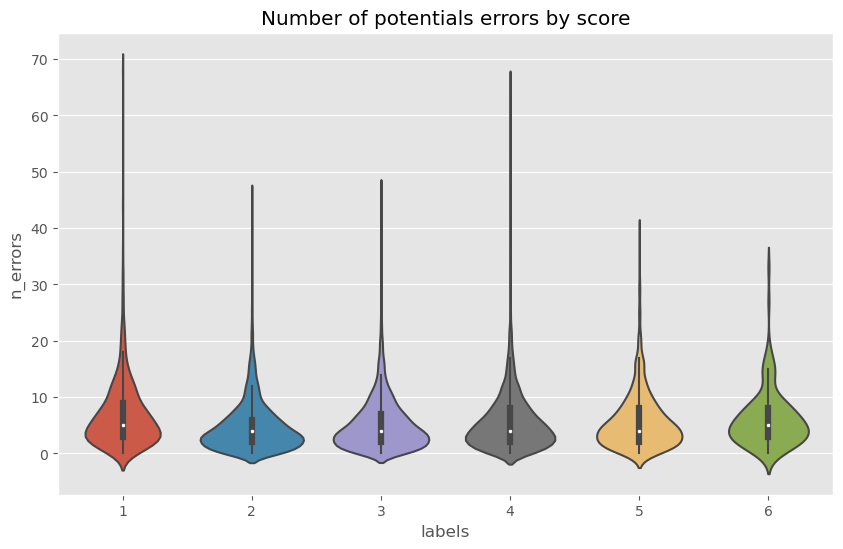

In [32]:
errors_by_score(df, 'simple_cleaned_text', glove)

In [14]:
df["n_errors"] = df["simple_cleaned_text"].progress_apply(lambda x: len(set(word_tokenize(x)).difference(glove.index_to_key)))
df["ratio_errors"] = df["n_errors"] / df["length"]

  0%|          | 0/17307 [00:00<?, ?it/s]

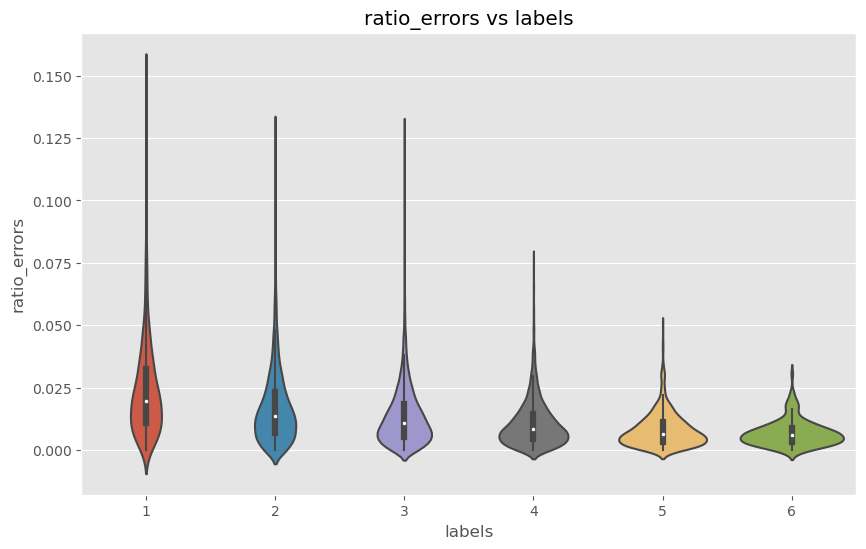

In [33]:
plot_violins(df, 'labels', 'ratio_errors')

les dsitibutions se concentrent de plus en plus, les médianes sont de plus en plus basses le ratio error/length semble être une information intéressante, nous allons nous convaincre ca avec un test statistiques

In [47]:
def mann_whitneyu_test_and_plot(list_samples: List[List[float]], list_labels: List[str]) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Apply the Mann Whitney U test and calculate Cohen's d effect size between each pair of sample groups.
    Display results as heatmaps for both p-values and Cohen's d with a green to red color gradient.
    
    Args:
        list_samples (List[List[float]]): The list of samples.
        list_labels (List[str]): The list of labels for each sample group.
    
    Returns:
        Tuple[pd.DataFrame, pd.DataFrame]: DataFrames of p-values and Cohen's d values.
    """
    
    n = len(list_samples)
    pvalues = np.full((n, n), np.nan)
    cohen_d = np.full((n, n), np.nan)

    for i in tqdm(range(n), desc='Mann Whitney U test'):
        for j in range(i + 1, n):
            stat, pvalue = mannwhitneyu(list_samples[i], list_samples[j], alternative='two-sided')
            pvalues[i, j] = pvalues[j, i] = pvalue
            d = (np.mean(list_samples[i]) - np.mean(list_samples[j])) / np.sqrt((np.var(list_samples[i]) + np.var(list_samples[j])) / 2)
            cohen_d[i, j] = cohen_d[j, i] = d

    df_pvalues = pd.DataFrame(pvalues, index=list_labels, columns=list_labels)
    df_cohen_d = pd.DataFrame(cohen_d, index=list_labels, columns=list_labels)

    green_red = LinearSegmentedColormap.from_list("green_to_red", ["green", "red"], N=256)
    red_green = LinearSegmentedColormap.from_list("red_to_green", ["red", "green"], N=256)

    plt.figure(figsize=(18, 8))

    plt.subplot(1, 2, 1)
    sns.heatmap(df_pvalues, cmap=green_red, cbar_kws={'label': 'P-value'})
    plt.title('Heatmap of p-values')
    plt.xlabel('Sample Groups')
    plt.ylabel('Sample Groups')

    plt.subplot(1, 2, 2)
    sns.heatmap(df_cohen_d, cmap=red_green, cbar_kws={'label': 'Cohen\'s d'})
    plt.title('Heatmap of Cohen\'s d')
    plt.xlabel('Sample Groups')
    plt.ylabel('Sample Groups')

    plt.tight_layout()
    plt.show()

    return df_pvalues, df_cohen_d

Mann Whitney U test:   0%|          | 0/6 [00:00<?, ?it/s]

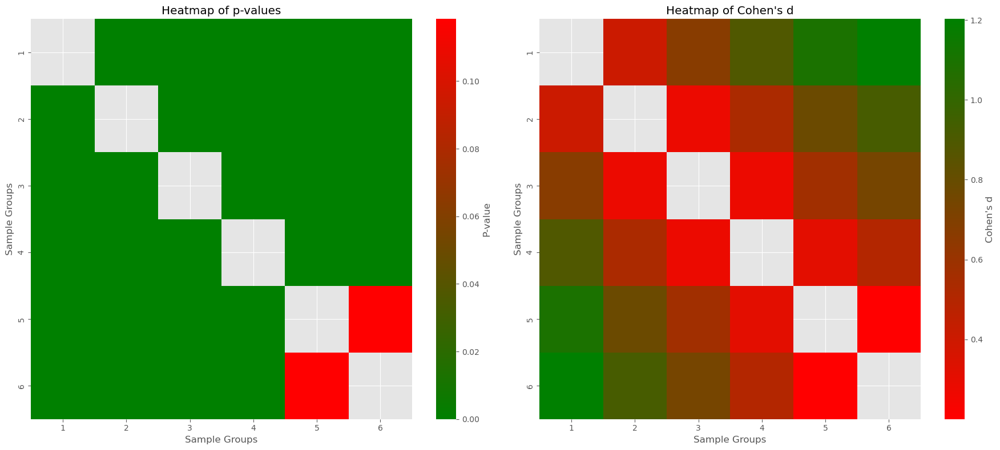

In [48]:
df_p, df_d = mann_whitneyu_test_and_plot([df[df['labels'] == i]['ratio_errors'] for i in sorted(df['labels'].unique())], sorted(df['labels'].unique()))

Le test de Mann-Whitney U, également connu sous le nom de test de Wilcoxon à deux échantillons indépendants, est une méthode non paramétrique utilisée pour tester si les valeurs d'une population ont tendance à être plus grandes que celles de l'autre population. Ici nou savons affiché la p-value ainsi que le coefficient Cohen d pour analyser l'effet de tailles, et en effets le test semble significatif car on retrouve des pvaleur très basses (max est de 0.10), et le on distingue clairement la différence entre les groupes via le Cohen's d (entre les notes élevées et basses). Le ratio est donc une information riche pourra nous être utile

In [12]:
df.head()

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...
4,"Dear, State Senator\r\n\r\nThis is a letter to...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...


On remarque que les distributions son tplus ou moins équivalentes, cette figure nous montre que ce n'est pas forcément les erreurs d'ortographes qui impactent les notes des essais, l'information n'est donc pas si importante que ça. On peut donc maintenant essayer de corriger ces erreurs.

Une première limite qu'on rencontre avec les Word embeddings comme wave2vec ou gloVe c'est cette dépédence au vocab qui n'est constitué que de mot, comme on peut voir sur notre ensemble de données seulement 35 % des tokens sont reconnus, ce nombre peut peut-être suffire pour notre use-case mais nous allons tout de même essayer d'augmenter ça. Malheureusement, on ne peut pas le faire sur tout le dataset mais que sur l'ensemble d'entrainement, sinon on se confronte au data leakage. Une solution pour remédier à ca c'est soit d'utiliser FastText qui justemet lui se base sur les n-grams et par conséquent rien ne lui est inconnu, soit d'augmenter ce % avec des métriques comme la distance de Levenhstein ou autre.

In [60]:
glove_twitter = downloader.load('glove-twitter-200')

[==================================================] 100.0% 758.5/758.5MB downloaded


In [62]:
value_coverage_twitter = vocabulary_coverage_glove(df, 'simple_cleaned_text', glove_twitter)

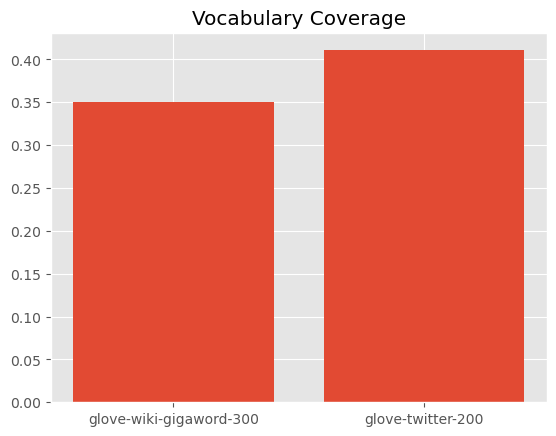

In [63]:
plot_value_coverage([value_coverage, value_coverage_twitter], ['glove-wiki-gigaword-300', 'glove-twitter-200'])

On remarque que le `glove-twitter-200` a un meilleur vocabulary coverage que le modèle choisi initialement. Nous allons observé les mots non-reconnus.

In [67]:
not_recognized_sample = list(value_coverage['words_not_in_glove'])
print(f"Some of the words not recognized by the model are: \n{not_recognized_sample[:10]}")

Some of the words not recognized by the model are: 
['rivialing', 'escame', 'oportunitie', 'backetball', 'esstimate', 'atmspheric', 'sycronize', 'legistlators', 'heigt', 'auothor']


In [68]:
def plot_not_recognized(not_recognized_sample: List[str],
                        output_path: Optional[str] = None) -> None:
    """
    Plot the not recognized words

    Args:
        not_recognized_sample {List[str]} -- the list of not recognized words
        output_path {Optional[str]} -- the output path
    """

    not_recognized_sample = [x for x in not_recognized_sample if x.isalpha()]
    not_recognized_sample = [x for x in not_recognized_sample if len(x) > 1]

    not_recognized_sample = pd.Series(not_recognized_sample).str[0].value_counts().sort_index()

    plt.bar(not_recognized_sample.index, not_recognized_sample)
    plt.title('Not recognized words')
    if output_path:
        plt.savefig(output_path)
    plt.show()

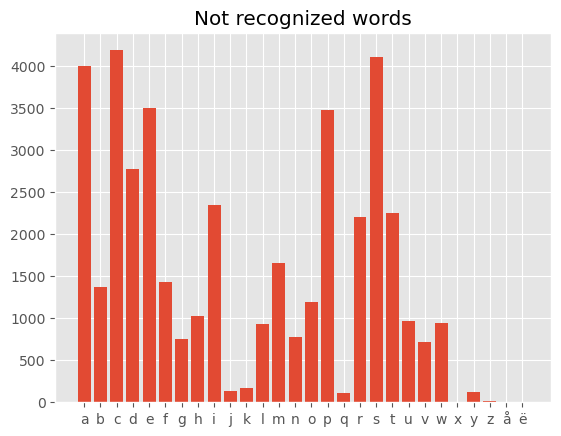

In [69]:
plot_not_recognized(not_recognized_sample)

On remarque encore une fois des erreurs, nous allons tenter de corriger ça et optimiser ce % avec la distance de levhenstein

In [87]:
def glove_levensthein_stream(df: pd.DataFrame,
                             column: str,
                             model) -> Generator[Tuple[str, str, float], None, None]:
    """
    Stream glove levenshtein distances

    Args:
        df {pd.DataFrame} -- the dataframe
        column {str} -- the column to be processed
        model {model} -- the model
    Yields:
        Generator[Tuple[str, str, float], None, None]: word, closest word, and distance (ratio)
    """

    vocabulary_cov = vocabulary_coverage_glove(df, column, model)
    words_not_in_glove = vocabulary_cov['words_not_in_glove']
    words_data = set(model.index_to_key)
    words_data = {re.sub(r'[^\w\s]', '', word) for word in words_data}
    words_data.discard('')

    for word in tqdm(words_not_in_glove, desc='Computing distances', total=len(words_not_in_glove)):
        best_match, max_ratio = None, 0.0
        for word_data in words_data:
            ratio = levenshtein_distance(word, word_data)
            if ratio > max_ratio:
                max_ratio, best_match = ratio, word_data
        yield word, best_match, max_ratio

def create_corrected_dict(stream: Generator[Tuple[str, str, float], None, None], 
                          threshold: float = 0.7) -> Dict[str, str]:
    """
    Create the corrected dictionary from the stream

    Args:
        stream {Generator[Tuple[str, str, float], None, None]} -- the stream of word pairs and distances (ratios)
        threshold {float} -- the threshold
    Returns:
        Dict[str, str]: the corrected dictionary with the previous word as key and the corrected word as value
    """

    corrected_dict = {}
    for word, best_match, ratio in stream:
        if ratio > threshold:
            corrected_dict[word] = best_match

    return corrected_dict

In [49]:
glove_stream = glove_levensthein_stream(df, 'simple_cleaned_text', glove)

In [50]:
glove_corrected_dict = create_corrected_dict(glove_stream)

Computing distances:   0%|          | 0/41557 [00:00<?, ?it/s]

In [51]:
json.dump(glove_corrected_dict, open('corrected_dict.json', 'w'))

In [88]:
def correct_text(text: str, 
                 corrected_dict: Dict[str, str]) -> str:
    """
    Correct the text

    Args:
        text {str} -- the text to be corrected
        corrected_dict {Dict[str, str]} -- the corrected dictionary
    Returns:
        str: the corrected text
    """
    
    tokens = word_tokenize(text)

    for i, token in enumerate(tokens):
        if token in corrected_dict:
            tokens[i] = corrected_dict[token]
    
    corrected_text = ' '.join(tokens)

    return corrected_text

In [89]:
glove_corrected_dict = json.load(open('corrected_dict.json'))

In [90]:
df['corrected_text'] = df['simple_cleaned_text'].progress_apply(lambda x: correct_text(x, glove_corrected_dict))

  0%|          | 0/17307 [00:00<?, ?it/s]

In [92]:
df.head()

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...
4,"Dear, State Senator\n\nThis is a letter to arg...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...


In [71]:
value_coverage_corrected = vocabulary_coverage_glove(df, 'corrected_text', glove_twitter)

In [72]:
value_coverage_wiki_corrected = vocabulary_coverage_glove(df, 'corrected_text', glove)

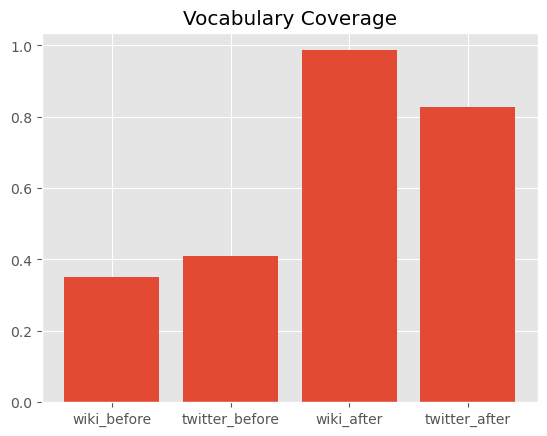

In [73]:
plot_value_coverage([value_coverage, value_coverage_twitter, value_coverage_wiki_corrected, value_coverage_corrected], 
                    ['wiki_before', 'twitter_before', 'wiki_after', 'twitter_after'])

In [76]:
print(f"Some examples of remaining words not recognized by the model:\n{list(value_coverage_wiki_corrected['words_not_in_glove'])[10:20]}")

Some examples of remaining words not recognized by the model:
['allkill', 'carbondioxide', 'walkon', 'unfotoghraghiball', 'outof', 'intercities', 'thirtynine', 'tbits', 'unipresident', 'efile']


  0%|          | 0/17307 [00:00<?, ?it/s]

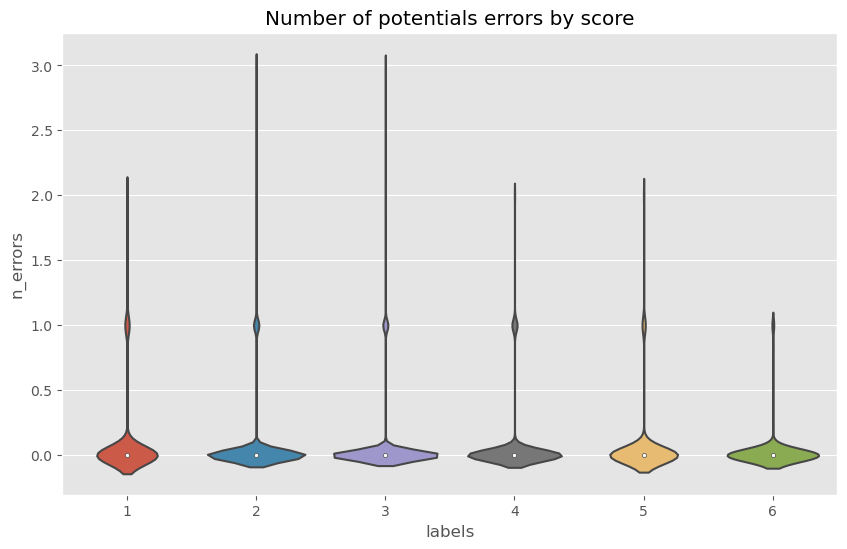

In [75]:
errors_by_score(df, 'corrected_text', glove)

Le nombre d'erreur a drastiquement baissé (on tourne a presque aucune par label)

In [78]:
df.to_csv('../train_cleaned.csv', index=False)

Après l'utilisation de la distance de levenshtein avec un ratio assez strict, on obtien presque 100% de vocabulary coverage. On remarque que ca a même augmenté cconsidérablement elui du modèle entrainé sur twitter.

J'ai mentionné plus haut que on se préocupait pas vraiment d'avoir des tokens inconnus dans le cadre d'architecture transformer. En effet, la plupart des vocabulaires associés à ces modèles construit avec des algorithmes comme Word piece ou Sentence Piece possède les caractères atomiques dans leur vocabulaire. Si on prend l'algorithme BPE, on par des caractères ASCII codés sur un octet chacun, puis en faisant itérativement des statistiques de co-occurences entre ces caractères, puis des combinaisons de de caractères et ainsi de suite, on se retrouve avec les caractères de base et le combinaisons (puis mots) les plus fréquents. On retrouve tout de même une notion de qualité de vocabulaire et ce que nous allons tenter d'explorer.

Pour ce faire nous allons nous intéresser à deuc tokenizer de deux modèles différents, un qui semble pertinent et un autre qui semble moins pertinent. 

In [79]:
model_code = "codeparrot/codeparrot"
model_nlp = "BAAI/bge-large-en-v1.5"

On a donc un modèle qui a été entrainé sur du code python, et donc un tokenizer qui également été entrainé sur du code, et d'un autre coté un modèle de type SBERT, qui sont particulièrement efficace pour la compréhension de texte et pour les tâches dites NLI

In [80]:
tokenizer_parrot = AutoTokenizer.from_pretrained(model_code)

tokenizer_config.json:   0%|          | 0.00/259 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/497k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/277k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/840k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/90.0 [00:00<?, ?B/s]

In [81]:
tokenizer_nlp = AutoTokenizer.from_pretrained(model_nlp)

Si on part du principie qu'il y a cet entrainement itératif comme mentionné plus haut, cela signifique que les mots incconus seront découpés en un certain nombre de n-grams, et donc il est légitime de penser que si on fait une courbe du nombre de tokens en fonction du nombre de caracètres et qu'on asocie à ca une régression linéaire, un tokenizer entrainé sur un corpus plus représentatif des mots que nous avons dans notre dataset se courbe en dessous d'un modèle moins pertinent, observons ça

In [82]:
# tokenizer overview
print(tokenizer_parrot)

GPT2TokenizerFast(name_or_path='codeparrot/codeparrot', vocab_size=32768, model_max_length=1024, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|endoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<|endoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}


In [83]:
print(tokenizer_nlp)

BertTokenizerFast(name_or_path='BAAI/bge-large-en-v1.5', vocab_size=30522, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	100: AddedToken("[UNK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	101: AddedToken("[CLS]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	102: AddedToken("[SEP]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	103: AddedToken("[MASK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}


On remarque pleins de paramètres, comme la taille du vaocabulaire ainsi que des stratégies de processing (padding/truncation)
Tokenizons une phrase en particulier

In [84]:
prompt_test = "def hello_world():\n    print('Hello, World!')\n\nhello_world()"

out_parrot = tokenizer_parrot(prompt_test, return_tensors="pt", add_special_tokens=False)
out_bge = tokenizer_nlp(prompt_test, return_tensors="pt", add_special_tokens=False)

In [85]:
out_parrot

{'input_ids': tensor([[  318, 16509,    63,  7617,   837,   272,   870,   360,  6257,    12,
         13064, 10916,   199,   199,  5006,    63,  7617,   342]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])}

In [86]:
out_bge

{'input_ids': tensor([[13366,  7592,  1035,  2088,  1006,  1007,  1024,  6140,  1006,  1005,
          7592,  1010,  2088,   999,  1005,  1007,  7592,  1035,  2088,  1006,
          1007]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])}

On retrouve ici les identifiants des tokens, le token-type_ids qui est nécessaire pour les taches de NSP et l'attention maskpermettant de faire la différence entre le pading et les tokens du texte source.

In [87]:
print(f'Length of the input for the model_code: {len(out_parrot["input_ids"][0])}\nLength of the input for the model_nlp: {len(out_bge["input_ids"][0])}')

Length of the input for the model_code: 18
Length of the input for the model_nlp: 21


On remarque qu'il y a 3 tokens de plus pour bge lorsqu'il faut tokenizer une fonction python

In [88]:
print(tokenizer_parrot.convert_ids_to_tokens(out_parrot['input_ids'][0]))

['def', 'Ġhello', '_', 'world', '():', 'ĊĠĠĠ', 'Ġprint', "('", 'Hello', ',', 'ĠWorld', "!')", 'Ċ', 'Ċ', 'hello', '_', 'world', '()']


In [89]:
print(tokenizer_nlp.convert_ids_to_tokens(out_bge['input_ids'][0]))

['def', 'hello', '_', 'world', '(', ')', ':', 'print', '(', "'", 'hello', ',', 'world', '!', "'", ')', 'hello', '_', 'world', '(', ')']


On remarque que sur les ponctuations, les deux tokenizer ne procèdent pas de la même manière. En effet, code-parrot a vu plus de code python que bge et a jugé que `():` apparaissait fréquement et les a donc regroupé  
Note: Les espace tabluations et autres on été remplacé par des caractères spéciauw non-utilisés, code-parrot a repris les mêmes patterns que gpt2

In [90]:
df_count = pd.DataFrame(columns=['parrot_length', 'n_chars', 'bge_length'])

df_count['parrot_length'] = df['corrected_text'].progress_apply(lambda x: len(tokenizer_parrot(x, add_special_tokens=False)['input_ids']))
df_count['n_chars'] = df['corrected_text'].progress_apply(lambda x: len(x))
df_count['bge_length'] = df['corrected_text'].progress_apply(lambda x: len(tokenizer_nlp(x, add_special_tokens=False)['input_ids']))

  0%|          | 0/17307 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (1194 > 1024). Running this sequence through the model will result in indexing errors


  0%|          | 0/17307 [00:00<?, ?it/s]

  0%|          | 0/17307 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (526 > 512). Running this sequence through the model will result in indexing errors


In [91]:
df.head()

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text,n_errors,ratio_errors
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...,15,0.027523
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...,3,0.008086
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...,3,0.004959
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...,1,0.001957
4,"Dear, State Senator\r\n\r\nThis is a letter to...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...,6,0.014354


In [92]:
fig = px.scatter(df_count, x='n_chars', y='parrot_length', trendline='ols', title='Parrot')
fig.show()

fig = px.scatter(df_count, x='n_chars', y='bge_length', trendline='ols', title='BGE')
fig.show()

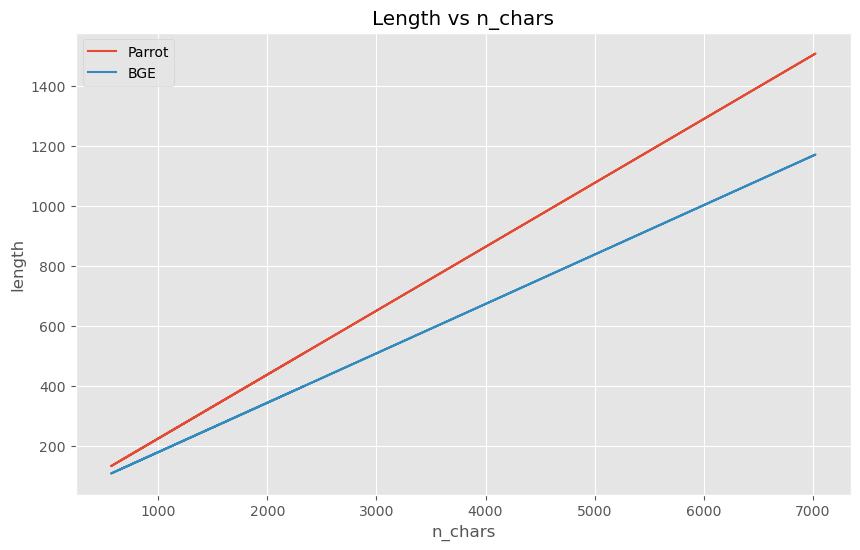

In [93]:
parrot_coef = 0.21324
bge_coef = 0.164849
parrot_b = 10.5084
bge_b = 13.3983

plt.figure(figsize=(10, 6))
plt.plot(df_count['n_chars'], parrot_coef * df_count['n_chars'] + parrot_b, label='Parrot')
plt.plot(df_count['n_chars'], bge_coef * df_count['n_chars'] + bge_b, label='BGE')

plt.xlabel('n_chars')
plt.ylabel('length')
plt.title('Length vs n_chars')
plt.legend()
plt.show()

Et en effet, on remarque qu'ici `bge` reconnait d'avantages de tokens que `code-parrot`, montrant que son vocabulaire recouvre d'avantage celui de notre dataset. Ceci nous communiquant une première métrique de choix de modèle pour notre tâche.

Même si le but du nettoyage avec la matrice de Lveneshtein était d'augmenter le voc coverage de GloVe, on peut tout de même profiter de ce nettoyage avec les autres modèles. Avant-ca, on doit stemmiser le texte pour réduire le vocabulaire et réduire la dimension de notre matrice TF-IDF. On va également retirer les stopwords, les liens etc... On va réutilisé la fonction de gensim qui fais ca pour nous

In [94]:
df['corrected_and_stemmed_text'] = df['corrected_text'].progress_apply(lambda x: " ".join(preprocess_string(x)))

  0%|          | 0/17307 [00:00<?, ?it/s]

In [97]:
unique_tokens_corrected_and_stemmed_text = set(word_tokenize(' '.join(df['corrected_and_stemmed_text'])))
unique_tokens_corrected_text = set(word_tokenize(' '.join(df['corrected_text'])))
unique_tokens_stemmed_text = set(word_tokenize(' '.join(df['stemmed_text'])))
unique_tokens_simple_cleaned_text = set(word_tokenize(' '.join(df['simple_cleaned_text'])))

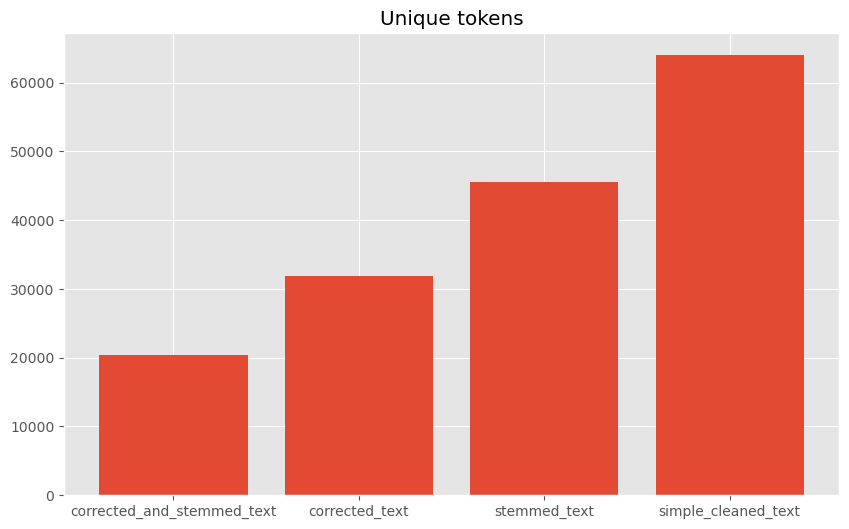

In [100]:
plt.figure(figsize=(10, 6))
plt.bar(['corrected_and_stemmed_text', 'corrected_text', 'stemmed_text', 'simple_cleaned_text'],
        [len(unique_tokens_corrected_and_stemmed_text), len(unique_tokens_corrected_text), len(unique_tokens_stemmed_text), len(unique_tokens_simple_cleaned_text)])
plt.title('Unique tokens')
plt.show()

Notre travail de nettoyage a réduit nettement la taille du vocabulaire

Afin de pouvoir analyser ca visuellement, nous allons projeter nos données et leur classes en 3D dimensions.
Dans un premier temps nous allons le faire avc TF-IDF et une technique nommée latent semantic analysis.
C'est tout simplement la decomposition en valeure singuliere de notre matrice TF-IDF, puis on recupere ce qu'on appelle
les vecteurs topics( correspondant aux vecteurs singluliers gauche ou droit en fonction de la dimension de notre matrice).
Ce processus pourrait être fait avec la classe PCA qui performe une SVD, cependant TruncatedSVD est adapté aux grandes, et sparses matrix. De plus les données n'ont pas besoin d'être centralisées par rapport au PCA (si on centralise on revient à approximer le PCA)

In [101]:
tfidf = TfidfVectorizer()

X = tfidf.fit_transform(df['corrected_and_stemmed_text'])

In [102]:
svd = TruncatedSVD(n_components=3)

X_svd = svd.fit_transform(X)

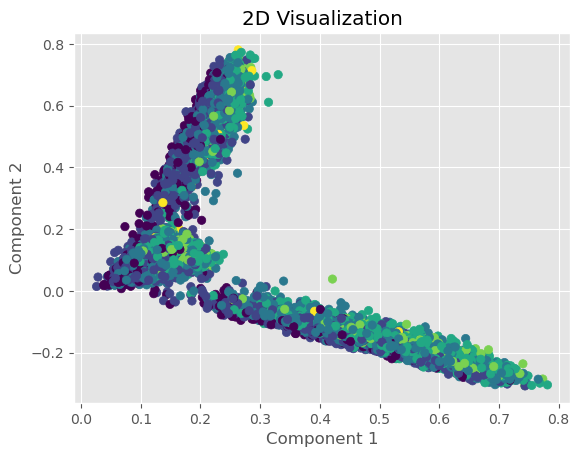

In [103]:
plt.scatter(X_svd[:, 0], X_svd[:, 1], c=df['labels'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('2D Visualization')
plt.show()

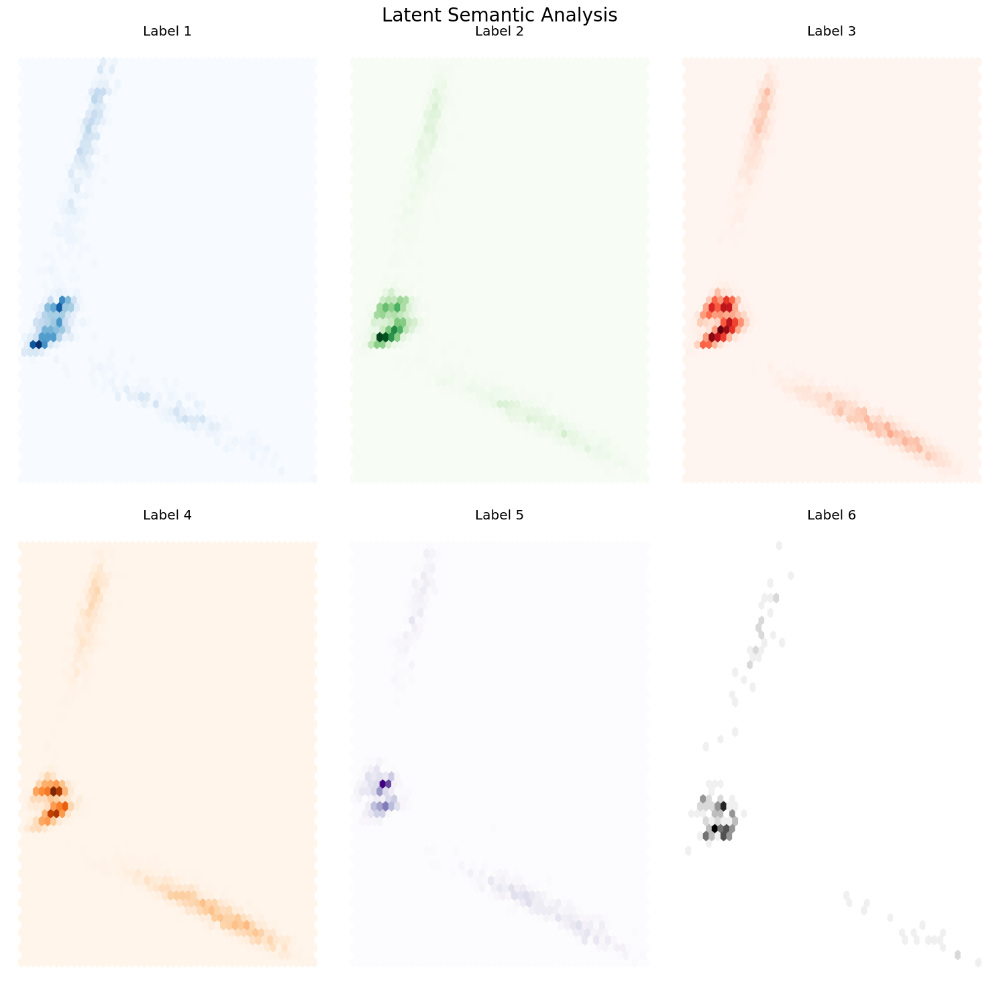

In [104]:
df_tsvd = pd.DataFrame(X_svd, columns=['component_1', 'component_2', 'component_3'])
df_tsvd['labels'] = df['labels']

fig, axs = plt.subplots(2, 3, figsize=(15, 15))
color = ['Blues', 'Greens', 'Reds', 'Oranges', 'Purples', 'Greys']
label_idx = 1

for i in range(2):
    for j in range(3):
        df_tmp = df_tsvd[df_tsvd['labels'] == label_idx]
        axs[i, j].hexbin(df_tmp['component_1'], df_tmp['component_2'], gridsize=50, cmap=color[label_idx-1])
        axs[i, j].set_title(f'Label {label_idx}')
        axs[i, j].axis('off')
        label_idx += 1

plt.suptitle('Latent Semantic Analysis', fontsize=20)
plt.tight_layout()
plt.show()

In [17]:
fig = px.scatter_3d(x=X_svd[:, 0], y=X_svd[:, 1], z=X_svd[:, 2], color=df['labels'], title='TF-IDF + TruncatedSVD')

fig.show()

En effet difficile de visualiser quoi que ce soit, cependant si on se met sous un certain angle, on remarque un dégradé de bleu vers jaune (en mettant l'axe x parrallèle et proche de nous)

Voyons si en vectorisant avec GloVe on réussit à voir plus de choses, on fait attention à n epas utiliser les documments tronqués

In [105]:
def word2vec(model, text: str) -> np.array:
    """
    Compute the word2vec with the GloVe model

    Args:
        model {model} -- the glove model
        text {str} -- the text
    Returns:
        np.array: the sentence embedding (mean of the word embeddings)
    """

    tokens = word_tokenize(text)
    cpt = 0
    word2vec = np.zeros(model.vector_size)
    for token in tokens:
        if token in model:
            cpt += 1
            word2vec += model[token]
    
    return word2vec / cpt

In [106]:
df['glove_embedding'] = df['corrected_text'].progress_apply(lambda x: word2vec(glove, x))

  0%|          | 0/17307 [00:00<?, ?it/s]

In [107]:
df.head()

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text,n_errors,ratio_errors,corrected_and_stemmed_text,glove_embedding
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...,15,0.027523,peopl car live thing know us car alot thing ha...,"[-0.0695527347872951, 0.11724673150032384, -0...."
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...,3,0.008086,scientist nasa discuss face mar explain face l...,"[-0.14897585759920945, 0.13492755006000795, -0..."
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...,3,0.004959,peopl wish technolog seen movi best new piec t...,"[-0.09919669959024432, 0.1462500293145618, -0...."
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...,1,0.001957,heard venu planet oxygen earthquak erupt volca...,"[-0.08007078340338382, 0.09905572381918645, -0..."
4,"Dear, State Senator\r\n\r\nThis is a letter to...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...,6,0.014354,dear state senat letter argu favor keep electo...,"[-0.0053858153222660935, 0.13435035317005323, ..."


Nous allons utiliser UMAP pour représenter nos vecteurs en 3D, l'algorithme attends des valeurs entre 0 et 1 nous allons donc utiliser MinMaxScaler pour normaliser nos vecteurs

In [108]:
minmax = MinMaxScaler()

glove_emmbeddings_scaled = minmax.fit_transform(np.array(df['glove_embedding'].tolist()))

In [109]:
umap_ = umap.UMAP(n_components=3)

glove_umap = umap_.fit_transform(glove_emmbeddings_scaled)

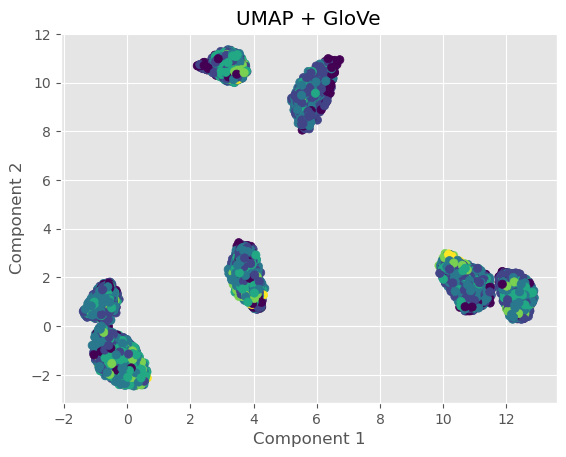

In [110]:
plt.scatter(glove_umap[:, 0], glove_umap[:, 1], c=df['labels'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('UMAP + GloVe')
plt.show()

In [30]:
fig = px.scatter_3d(x=glove_umap[:, 0], y=glove_umap[:, 1], z=glove_umap[:, 2], color=df['labels'], title='UMAP + GloVe')

fig.show()

Encore une fois difficile d'aperçevoir quoi que ce soit, il faut dire qu'il y a tout de même des dégradés un peu partout et qu'il y a 6 labels au total

On va utiliser BGE qui a un vocabulaire aligné au notre

In [14]:
model = SentenceTransformer('BAAI/bge-large-en-v1.5')

/opt/anaconda3/lib/python3.11/site-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
/opt/anaconda3/lib/python3.11/site-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [15]:
embeddings = model.encode(df['corrected_text'].tolist(), show_progress_bar=True)

Batches:   0%|          | 0/541 [00:00<?, ?it/s]

In [16]:
df['bge_embedding'] = embeddings.tolist()

In [115]:
df.head()

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text,n_errors,ratio_errors,bge_embedding
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...,15,0.027523,"[-0.013340512290596962, 0.057191599160432816, ..."
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...,3,0.008086,"[0.03433642536401749, 0.03694551810622215, 0.0..."
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...,3,0.004959,"[0.008354787714779377, 0.03657008707523346, 0...."
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...,1,0.001957,"[0.013407398015260696, 0.04185137525200844, 0...."
4,"Dear, State Senator\r\n\r\nThis is a letter to...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...,6,0.014354,"[0.03725903108716011, -0.00485394150018692, 0...."


In [117]:
minmax = MinMaxScaler()

bge_emmbeddings_scaled = minmax.fit_transform(np.array(df['bge_embedding'].tolist()))

umap_ = umap.UMAP(n_components=3)

bge_umap = umap_.fit_transform(bge_emmbeddings_scaled)

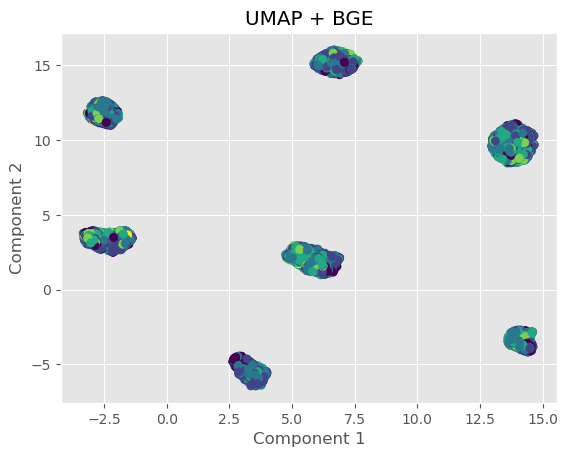

In [118]:
plt.scatter(bge_umap[:, 0], bge_umap[:, 1], c=df['labels'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('UMAP + BGE')
plt.show()

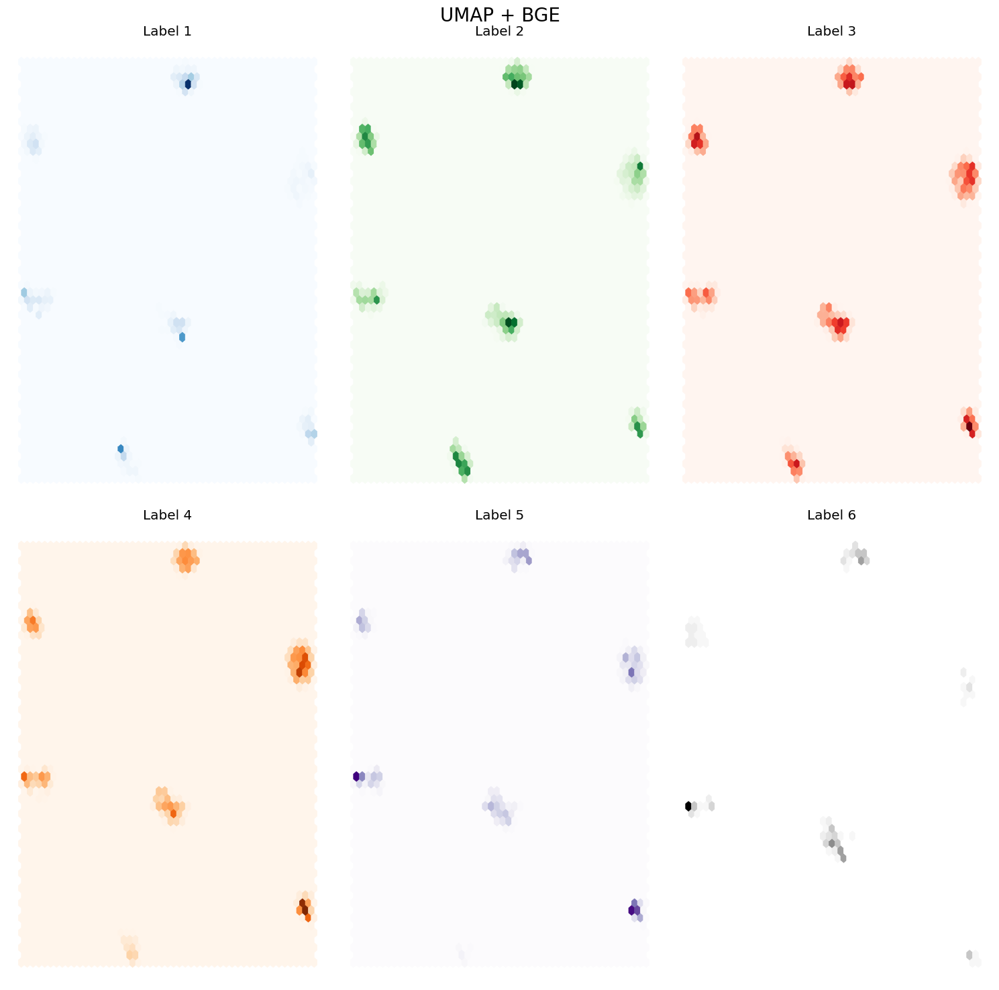

In [119]:
fig, axs = plt.subplots(2, 3, figsize=(15, 15))
color = ['Blues', 'Greens', 'Reds', 'Oranges', 'Purples', 'Greys']
label_idx = 1

for i in range(2):
    for j in range(3):
        df_tmp = df[df['labels'] == label_idx]
        axs[i, j].hexbin(bge_umap[df_tmp.index, 0], bge_umap[df_tmp.index, 1], gridsize=50, cmap=color[label_idx-1])
        axs[i, j].set_title(f'Label {label_idx}')
        axs[i, j].axis('off')
        label_idx += 1

plt.suptitle('UMAP + BGE', fontsize=20)
plt.tight_layout()
plt.show()

In [120]:
px.scatter_3d(x=bge_umap[:, 0], y=bge_umap[:, 1], z=bge_umap[:, 2], color=df['labels'], title='UMAP + BGE')

In [121]:
pca = PCA(n_components=3)
scaler = StandardScaler()

scaled_embeddings = scaler.fit_transform(df['bge_embedding'].tolist())

bge_pca = pca.fit_transform(scaled_embeddings)

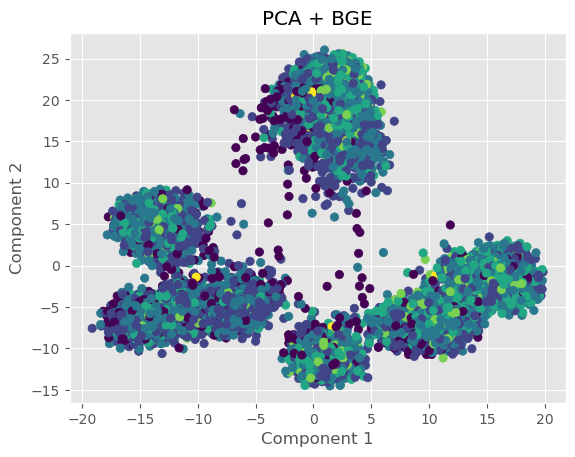

In [122]:
df_pca = pd.DataFrame(bge_pca, columns=['comp1', 'comp2', 'comp3'])
df_pca['labels'] = df['labels']

plt.scatter(df_pca['comp1'], df_pca['comp2'], c=df_pca['labels'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA + BGE')
plt.show()

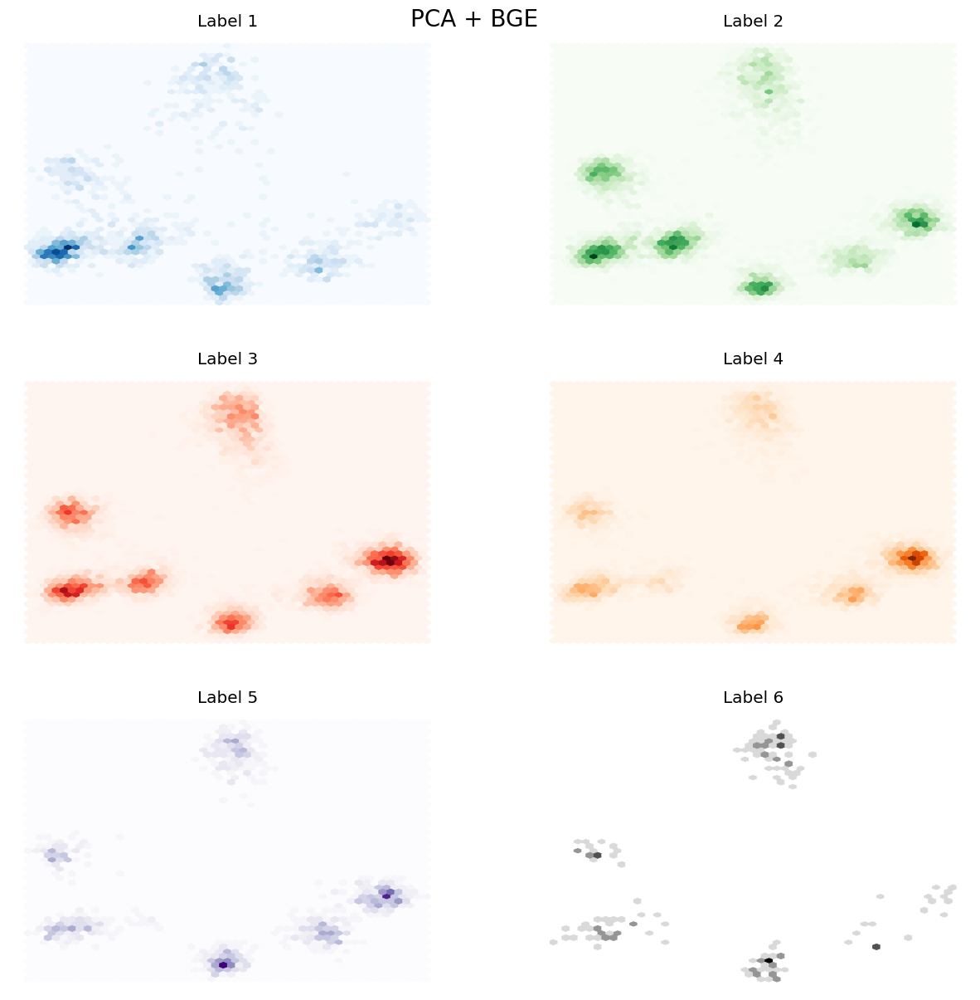

In [123]:
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

color = ['Blues', 'Greens', 'Reds', 'Oranges', 'Purples', 'Greys']
label_idx = 1
for i in range(3):
    for j in range(2):
        df_tmp = df_pca[df_pca['labels'] == label_idx]
        axs[i, j].hexbin(df_tmp['comp1'], df_tmp['comp2'], gridsize=50, cmap=color[label_idx - 1])
        axs[i, j].set_title(f'Label {label_idx}')
        axs[i, j].axis('off')
        label_idx += 1

plt.suptitle('PCA + BGE', fontsize=20, y=0.9)
plt.show()

In [124]:
px.scatter_3d(x=bge_pca[:, 0], y=bge_pca[:, 1], z=bge_pca[:, 2], color=df['labels'], title='PCA + BGE')

Nous allons maintenant analyser en dimensions réduités les embeddings générés avec fasttext, on pourrait utiliser un modèle pré-entrainé ,mais ici nous n'allons pas faire du `transfert learning`, nous allons directement entrainé le modèle sur notre corpus

In [125]:
with open('tmp.txt', 'w') as f:
    for text in df['corrected_text']:
        f.write(text + '\n')

ft_model = fasttext.train_unsupervised('tmp.txt', model='skipgram')

Read 5M words
Number of words:  11748
Number of labels: 0
Progress: 100.0% words/sec/thread:  180390 lr:  0.000000 avg.loss:  2.018147 ETA:   0h 0m 0s


In [126]:
def embed_with_fasttext(model, text: str) -> np.array:
    """
    Compute the embedding with fasttext

    Args:
        model {model} -- the fasttext model
        text {str} -- the text
    Returns:
        np.array: the sentence embedding (mean of the word embeddings)
    """

    return model.get_sentence_vector(text)

In [127]:
df['fasttext_embedding'] = df['corrected_text'].progress_apply(lambda x: embed_with_fasttext(ft_model, x))

  0%|          | 0/17307 [00:00<?, ?it/s]

In [128]:
minmax = MinMaxScaler()

fasttext_emmbeddings_scaled = minmax.fit_transform(np.array(df['fasttext_embedding'].tolist()))

umap_ = umap.UMAP(n_components=3)

fasttext_umap = umap_.fit_transform(fasttext_emmbeddings_scaled)

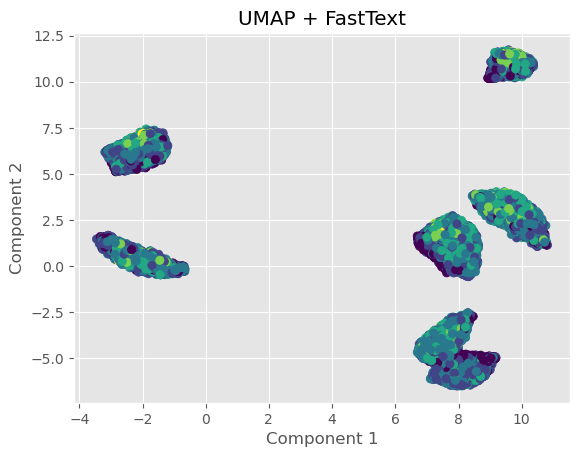

In [129]:
plt.scatter(fasttext_umap[:, 0], fasttext_umap[:, 1], c=df['labels'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('UMAP + FastText')
plt.show()

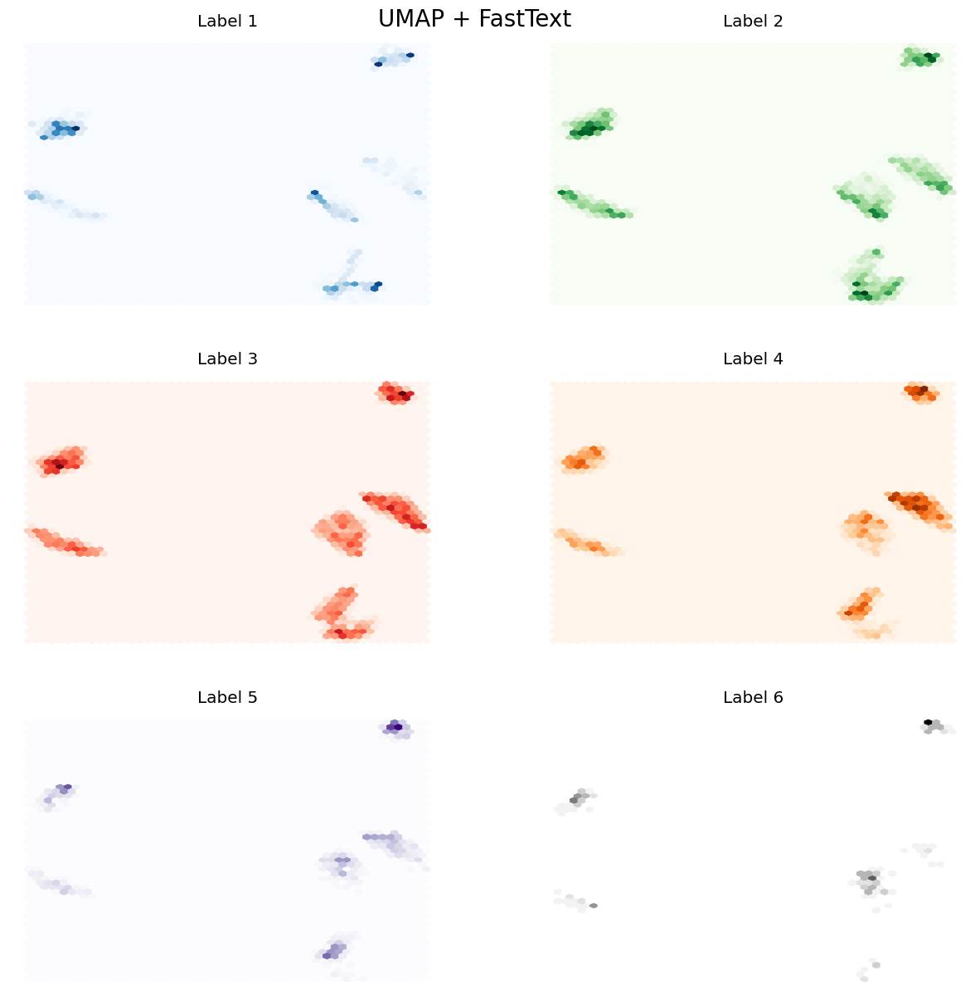

In [130]:
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

color = ['Blues', 'Greens', 'Reds', 'Oranges', 'Purples', 'Greys']
label_idx = 1

for i in range(3):
    for j in range(2):
        df_tmp = df[df['labels'] == label_idx]
        axs[i, j].hexbin(fasttext_umap[df_tmp.index, 0], fasttext_umap[df_tmp.index, 1], gridsize=50, cmap=color[label_idx - 1])
        axs[i, j].set_title(f'Label {label_idx}')
        axs[i, j].axis('off')
        label_idx += 1

plt.suptitle('UMAP + FastText', fontsize=20, y=0.9)
plt.show()

In [131]:
px.scatter_3d(x=fasttext_umap[:, 0], y=fasttext_umap[:, 1], z=fasttext_umap[:, 2], color=df['labels'], title='UMAP + FastText')

On remarque 6 ou 7 clusters sur chaque visualiations, ce qui est curieux. Malheuresement nous n'arrivons pas à visualiser quoi que ce soit du'tile pour problème avec les modèles d'embeddings. Le LSA nous montre,, quant à lui, un dégradé très interpretable.
Analysons les embeddings de `BGE`en appliquant un `KMEANS`

In [6]:
minmax = MinMaxScaler()

bge_mm = minmax.fit_transform(df['bge_embedding'].tolist())

km = KMeans(n_clusters=7, random_state=42)

df['bge_cluster'] = km.fit_predict(bge_mm)

In [7]:
df.head()

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text,n_errors,ratio_errors,bge_embedding,bge_cluster
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...,15,0.027523,"[-0.013340512290596962, 0.057191599160432816, ...",1
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...,3,0.008086,"[0.03433642536401749, 0.03694551810622215, 0.0...",3
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...,3,0.004959,"[0.008354787714779377, 0.03657008707523346, 0....",2
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...,1,0.001957,"[0.013407398015260696, 0.04185137525200844, 0....",0
4,"Dear, State Senator\r\n\r\nThis is a letter to...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...,6,0.014354,"[0.03725903108716011, -0.00485394150018692, 0....",4


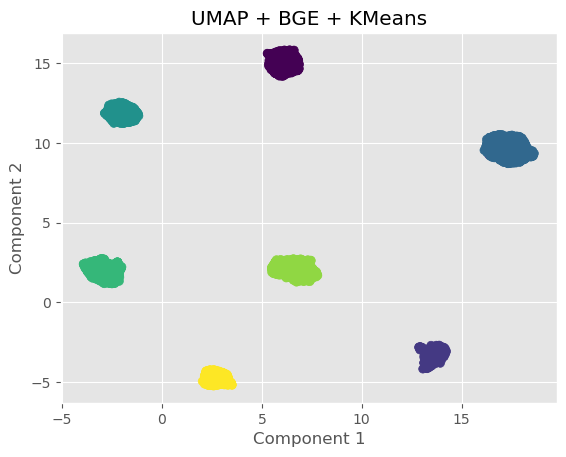

In [11]:
umap_ = umap.UMAP(n_components=3, random_state=42)

bge_umap = umap_.fit_transform(bge_mm)

plt.scatter(bge_umap[:, 0], bge_umap[:, 1], c=df['bge_cluster'])
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('UMAP + BGE + KMeans')
plt.show()

In [12]:
px.scatter_3d(x=bge_umap[:, 0], y=bge_umap[:, 1], z=bge_umap[:, 2], color=df['bge_cluster'], title='UMAP + BGE + KMeans')

In [149]:
silhouette_scores = []
inertia = []

for k in tqdm(range(2, 10), desc='KMeans'):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(bge_mm)
    silhouette_scores.append((k, silhouette_score(bge_mm, km.labels_)))
    inertia.append((k, km.inertia_))

KMeans:   0%|          | 0/8 [00:00<?, ?it/s]

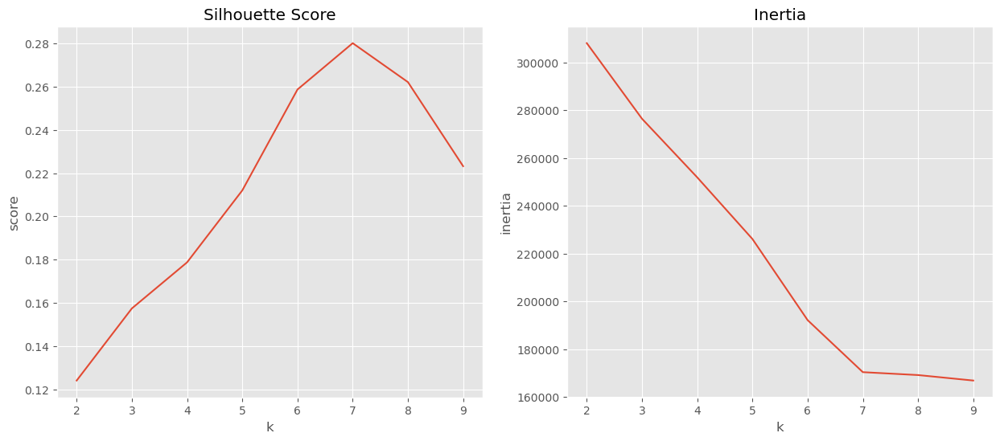

In [150]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

x, y = zip(*silhouette_scores)
axs[0].plot(x, y)
axs[0].set_title('Silhouette Score')
axs[0].set_xlabel('k')
axs[0].set_ylabel('score')

x, y = zip(*inertia)
axs[1].plot(x, y)
axs[1].set_title('Inertia')
axs[1].set_xlabel('k')
axs[1].set_ylabel('inertia')

plt.show()

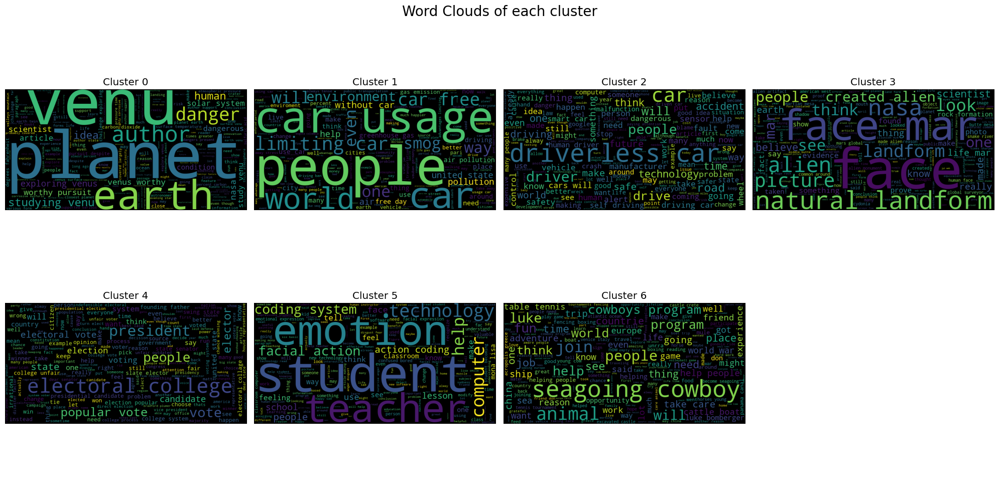

In [136]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for i in range(2):
    for j in range(4):
        if i * 4 + j == 7:
            axs[i, j].axis('off')
            break
        cluster = i * 4 + j
        wc = wordcloud.WordCloud(width=800, height=400).generate(' '.join(df[df['bge_cluster'] == cluster]['corrected_text']))
        axs[i, j].imshow(wc)
        axs[i, j].set_title(f'Cluster {cluster}')
        axs[i, j].axis('off')

plt.suptitle('Word Clouds of each cluster', fontsize=20)
plt.tight_layout()
plt.show()

In [139]:
df.head()

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text,n_errors,ratio_errors,bge_embedding,fasttext_embedding,bge_cluster
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...,15,0.027523,"[-0.013340512290596962, 0.057191599160432816, ...","[-0.05350526, -0.035797294, 0.05505764, 0.0132...",1
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...,3,0.008086,"[0.03433642536401749, 0.03694551810622215, 0.0...","[-0.08904234, -0.035376858, 0.041457325, 0.026...",3
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...,3,0.004959,"[0.008354787714779377, 0.03657008707523346, 0....","[-0.09231006, -0.043829113, 0.025212301, 0.008...",2
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...,1,0.001957,"[0.013407398015260696, 0.04185137525200844, 0....","[-0.13227421, -0.025674561, 0.046610862, 0.007...",0
4,"Dear, State Senator\r\n\r\nThis is a letter to...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...,6,0.014354,"[0.03725903108716011, -0.00485394150018692, 0....","[-0.082092494, -0.043435834, 0.033904742, -0.0...",4


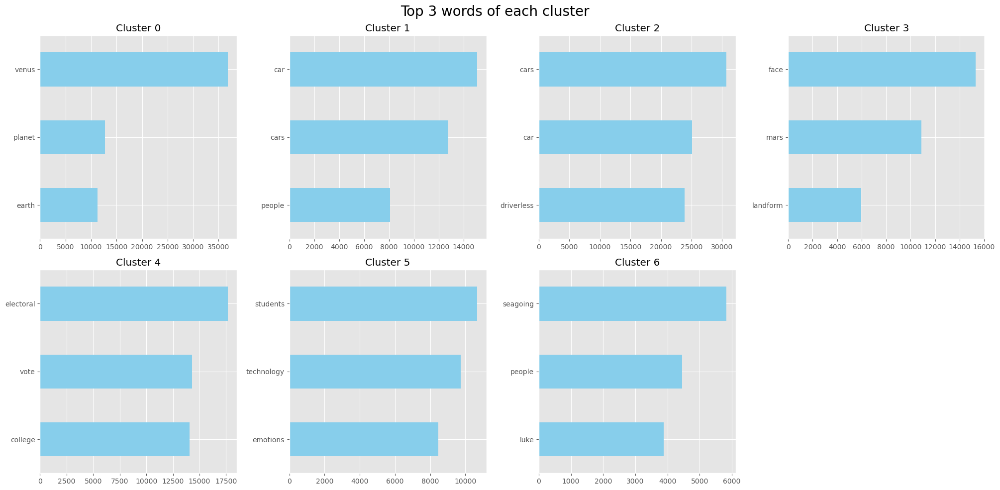

In [138]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for i in range(2):
    for j in range(4):
        cluster_index = i * 4 + j
        if cluster_index == 7:  
            axs[i, j].axis('off')
            break

        words = ' '.join(df[df['bge_cluster'] == cluster_index]['corrected_text'])
        words = remove_stopwords(words)
        
        word_counts = collections.Counter(words.split())
        top_words = pd.Series(word_counts).nlargest(3)
        
        top_words.sort_values().plot(kind='barh', ax=axs[i, j], color='skyblue')
        axs[i, j].set_title(f'Cluster {cluster_index}')

plt.suptitle('Top 3 words of each cluster', fontsize=20)
plt.tight_layout()
plt.show()

On voit clairement que chaque clusters a un topic associés comme l'écologie, la politique ou autre. C'est sûrement relié à différents examens regroupés dans le dataset, on peut donc conjecturer qu'il y a au total 6 ou 7 différents examens.

In [140]:
df_value_cluster_score = df.groupby(['bge_cluster', 'labels']).size().reset_index(name='count')
df_value_cluster_score = df_value_cluster_score.sort_values(by=['bge_cluster', 'count'], ascending=False)

fig = px.bar(df_value_cluster_score, x='bge_cluster', y='count', color='labels', title='Cluster vs Score')
fig.show()

In [158]:
df_value_cluster_score = df.groupby(['labels', 'bge_cluster']).size().reset_index(name='count')
df_value_cluster_score = df_value_cluster_score.sort_values(by=['labels', 'count'], ascending=False)

fig = px.bar(df_value_cluster_score, x='labels', y='count', color='bge_cluster', title='Score vs Cluster')
fig.show()

Nous allons maintenant chercher les topics avec une technique appelée LDA(Latent Derichlet Allocation). On va supposer ici que l'on a 7 topics différents (comme vu ci-dessus)

In [153]:
documents = df['corrected_text'].progress_apply(lambda x: preprocess_string(x))

dico = Dictionary(documents)
corpus = [dico.doc2bow(doc) for doc in documents]

lda = LdaModel(corpus=corpus, id2word=dico, num_topics=7, random_state=42)

  0%|          | 0/17307 [00:00<?, ?it/s]

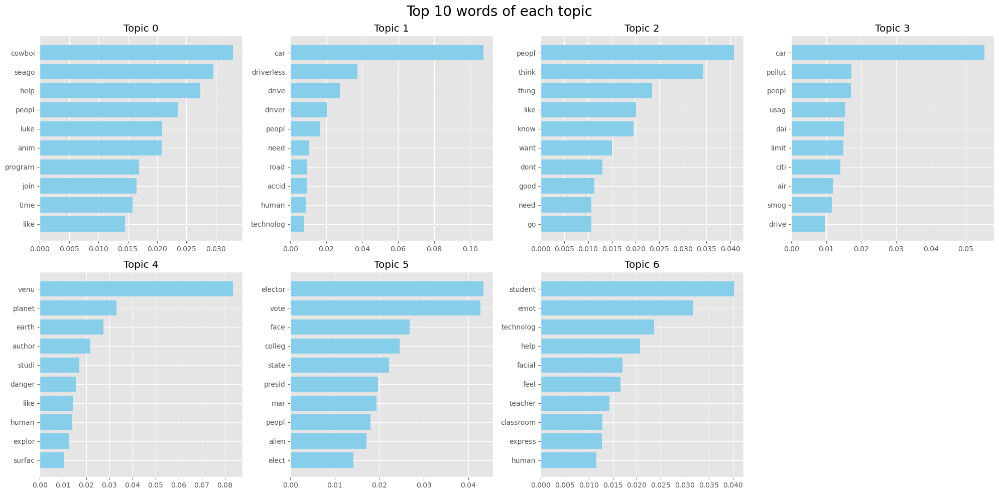

In [155]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for i in range(2):
    for j in range(4):
        topic_index = i * 4 + j
        if topic_index == 7:
            axs[i, j].axis('off')
            break

        topic = lda.show_topic(topic_index, topn=10)
        words, probs = zip(*topic)
        axs[i, j].barh(words, probs, color='skyblue')
        axs[i, j].set_title(f'Topic {topic_index}')
        axs[i, j].invert_yaxis()

plt.suptitle('Top 10 words of each topic', fontsize=20)
plt.tight_layout()

plt.show()

On démarque plus ou moins les mêmes topics que ceux remarqués avec KMEANS, on en retrouve autour de l'espace et l'exploration, un autre sur de la politique etc...

In [160]:
df.drop(columns=['fasttext_embedding'], inplace=True)

In [165]:
df.drop(columns=['bge_cluster'], inplace=True)

In [170]:
df

,text,labels,length,stemmed_text,simple_cleaned_text,corrected_text,n_errors,ratio_errors,bge_embedding
0,Many people have car where they live. The thin...,3,545,peopl car live thing know us car alot thing ha...,many people have car where they live the thing...,many people have car where they live the thing...,15,0.027523,"[-0.013340512290596962, 0.057191599160432816, ..."
1,I am a scientist at NASA that is discussing th...,3,371,scientist nasa discuss face mar explain face l...,scientist nasa that discussing the face mars w...,scientist nasa that discussing the face mars w...,3,0.008086,"[0.03433642536401749, 0.03694551810622215, 0.0..."
2,People always wish they had the same technolog...,4,605,peopl wish technolog seen movi best new piec t...,people always wish they had the same technolog...,people always wish they had the same technolog...,3,0.004959,"[0.008354787714779377, 0.03657008707523346, 0...."
3,"We all heard about Venus, the planet without a...",4,511,heard venu planet oxygen earthquak erupt volca...,all heard about venus the planet without almos...,all heard about venus the planet without almos...,1,0.001957,"[0.013407398015260696, 0.04185137525200844, 0...."
4,"Dear, State Senator\r\n\r\nThis is a letter to...",3,418,dear state senat letter argu favor keep electo...,dear state senator this letter argue favor kee...,dear state senator this letter argue favor kee...,6,0.014354,"[0.03725903108716011, -0.00485394150018692, 0...."
...,...,...,...,...,...,...,...,...,...
17302,"the story "" The Challenge of Exploing Venus "" ...",2,167,stori challeng explo venu inform piec danger r...,the story the challenge exploing venus informa...,the story the challenge exploding venus inform...,9,0.053892,"[-0.0026579236146062613, 0.03404766693711281, ..."
17303,Technology has changed a lot of ways that we l...,4,644,technolog chang lot wai live todai nowadai pho...,technology has changed lot ways that live toda...,technology has changed lot ways that live toda...,12,0.018634,"[0.022875061258673668, 0.0028401522431522608, ..."
17304,If you don't like sitting around all day than ...,2,235,like sit dai great opportun particip seago cow...,you don like sitting around all day than great...,you don like sitting around all day than great...,1,0.004255,"[0.05132417753338814, 0.03958769142627716, -0...."
17305,"In ""The Challenge of Exporing Venus,"" the auth...",1,264,challeng expor venu author suggest studi venu ...,the challenge exporing venus the author sugges...,the challenge exporting venus the author sugge...,3,0.011364,"[0.028783557936549187, 0.02481551095843315, 0...."


In [179]:
df = df[["corrected_text", "labels"]]
df.rename(columns={"corrected_text": "text"}, inplace=True)

In [180]:
df.head()

,text,labels
0,many people have car where they live the thing...,3
1,scientist nasa that discussing the face mars w...,3
2,people always wish they had the same technolog...,4
3,all heard about venus the planet without almos...,4
4,dear state senator this letter argue favor kee...,3


In [182]:
df_train, df_test = train_test_split(df, test_size=0.2, stratify=df['labels'], random_state=42)
df_train, df_val = train_test_split(df_train, test_size=0.2, stratify=df_train['labels'], random_state=42)

In [183]:
print(f"Train size: {df_train.shape[0]}\nValidation size: {df_val.shape[0]}\nTest size: {df_test.shape[0]}")

Train size: 11076
Validation size: 2769
Test size: 3462


In [184]:
df_train.to_csv('../../data/train.csv', index=False)
df_val.to_csv('../../data/val.csv', index=False)
df_test.to_csv('../../data/test.csv', index=False)